AS.430.271.81: M02 - Adam Thomas

# M02 Homework
This JupyterLab Notebook will implement the following tasks:

- Assume all spatial data is in WGS84
- Implement the haversine function to calculate the distance between two lon/lat coordinates and vectorize it using numpy.
- Implement a function to convert lon/lat values to Web Mercator and vectorize it using numpy
- Read the train.csv file from https://www.kaggle.com/c/new-york-city-taxi-fare-prediction/data using pandas
- Show a kde plot of dropoff locations that originated from JFK
- Make sure to read the pickup dates as timestamps
- Plot using seaborn the distribution by:
  - date of week
  - hour of day
- Append the haversine distance to the trip record and show top 10 longest records
- Convert the lon/lat values to web mercator value using the above function
- Plot the top 10000 pickup locations in lower Manhattan in Web Mercator - you have to aggregate by 100 meters, plot the aggregated locations with the most counts

In [1]:
# Import required libraries
import colorcet
import contextily
import datashader
import geopandas
import h3
import numpy
import pandas
import seaborn
from shapely.geometry import LineString, Polygon

# Set default map source for contextily
map_source = 'https://api.mapbox.com/styles/v1/mapbox/dark-v11/tiles/{z}/{x}/{y}?access_token=pk.eyJ1IjoiYW10aG9tYXMiLCJhIjoiY2xkcDkzbzQwMHh5bTN1a2R3MGlydnN6ZyJ9.uQjZh-jqKwgLX7alCt2foQ'

## Load and clean data
### Convert data to dataframe

In [2]:
train_df = pandas.read_csv('train.csv')

# Convert datetime fields
train_df[['pickup_datetime', 'dropoff_datetime']] = train_df[['pickup_datetime', 'dropoff_datetime']].apply(pandas.to_datetime)

### Inspect tabular records

Let's look at the tabular records to see some statistics about each column, and if there are records we should filter out.

In [3]:
train_df.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,4.987772e-01,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,1.000000e+00,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


There are some anamalous data entries in the tabular data summary above. Namely the trip duration has a maximum journey time of 3,526,282 seconds (979 hours!). Let's filter the maximum journey time to 7,200 seconds (2 hours).

In [4]:
train_df = train_df[train_df['trip_duration'] < 7200]

There are also many records where the pickup location is far outside our area of interest in NYC. Let's filter the data to within a bounding box of interest using: http://bboxfinder.com/#40.488737,-74.292297,41.159012,-73.405151, and remove any records where the pickup_location and the dropoff_location are the same (indicates a potential invalid trip?).

In [5]:
xmin,ymin,xmax,ymax = [-74.292297,40.488737,-73.405151,41.159012]
train_df = train_df[(train_df['pickup_latitude'].between(ymin,ymax)) & 
                    (train_df['pickup_longitude'].between(xmin,xmax)) & 
                    (train_df['dropoff_latitude'].between(ymin,ymax)) & 
                    (train_df['dropoff_longitude'].between(xmin,xmax)) &
                   ((train_df['pickup_latitude'] != train_df['dropoff_latitude']) & 
                    (train_df['pickup_longitude'] != train_df['dropoff_longitude']))]

### Inspect geographic records

Now that we've filtered records just based on the tabular data, let's look at the data geographically to see if it makes sense.

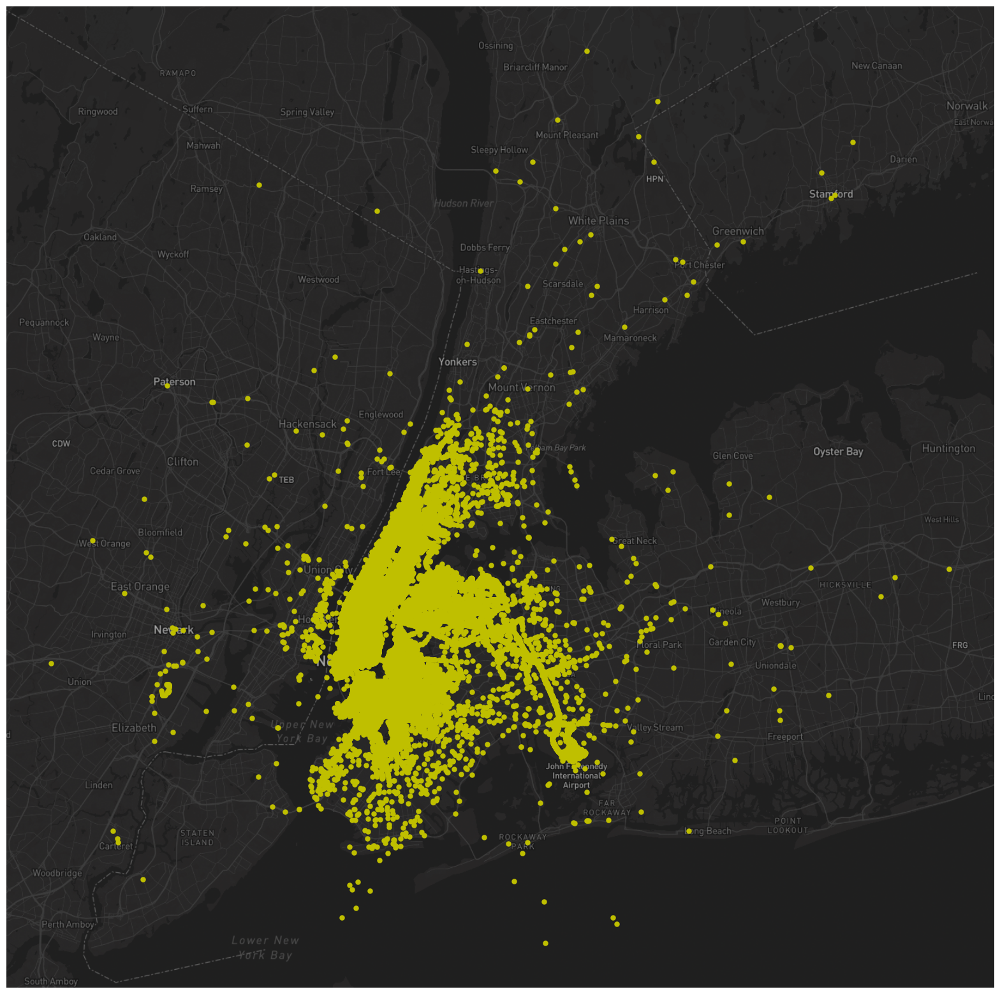

In [6]:
# Create geopandas dataframe using pickup location as the geometry
pickup_df = geopandas.GeoDataFrame(train_df, geometry=geopandas.points_from_xy(train_df.pickup_longitude, train_df.pickup_latitude), crs=f"EPSG:4326")

# Plot pickup locations
ax = pickup_df.to_crs(epsg=3857).plot(figsize=(20, 20), alpha=1.0, color='y', edgecolor="face", linewidth=0.1)
contextily.add_basemap(ax, source=map_source)
ax.set_axis_off()

The geographic results look mostly good, but there are some records that appear to be in the water. Let's clip the results of the data so that the pickup location and dropoff location are both on land! Using coarse(ish) 1:10M data from Natural Earth here: https://www.naturalearthdata.com/downloads/10m-cultural-vectors. For more accurate filtering, I would use a much more detailed representation of the coastline.

In [7]:
land_boundary = geopandas.read_file('NYNJ_Boundary.shp')

In [8]:
# Clip pickup locations to within NYNJ_Boundary.shp
pickup_df = pickup_df.clip(land_boundary)

# Now do the same for dropoff locations
dropoff_df = geopandas.GeoDataFrame(pickup_df, geometry=geopandas.points_from_xy(pickup_df.dropoff_longitude, pickup_df.dropoff_latitude), crs=f"EPSG:4326")

# Cleaned version is a geopandas dataframe with pickup and dropoff locations clipped to NYBJ_Boundary.shp, with dropoff locations as the default geopandas geometry
cleaned_df = dropoff_df.clip(land_boundary)

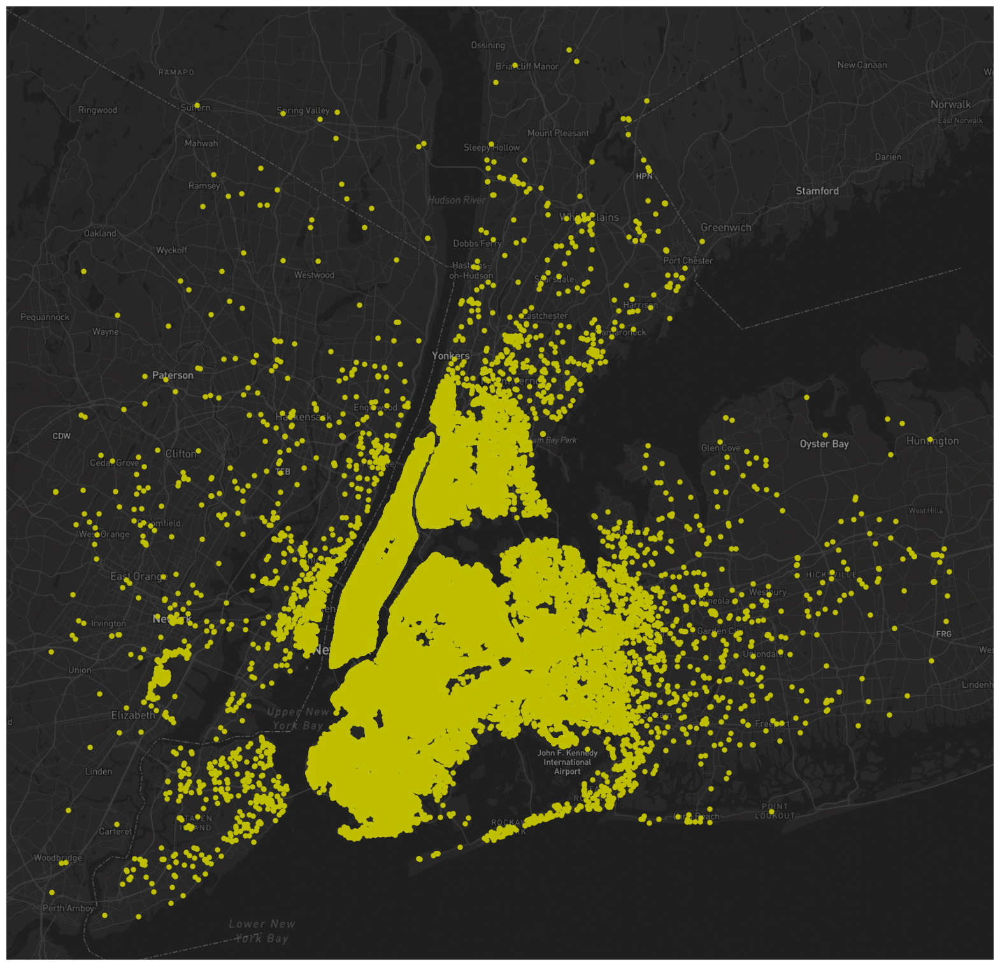

In [9]:
# Plot cleaned dropoff locations
ax = cleaned_df.to_crs(epsg=3857).plot(figsize=(20, 20), alpha=1.0, color='y', edgecolor="face", linewidth=0.1)
contextily.add_basemap(ax, source=map_source)
ax.set_axis_off()

This is looking much nicer. Now we have taxi journeys that are less than 2 hours in duration, and pickup/dropoff locations within the land boundaries of New Jersey and New York States.

And just for fun, let's visualize the density of the dropoff locations using datashader, because it's a bit hard to see the density of points using the above map plots. It is also much much faster to visualize this many data records using datashader. Serendipitously, datashader use the same NYC taxi data in their example here: https://datashader.org/getting_started/Introduction.html

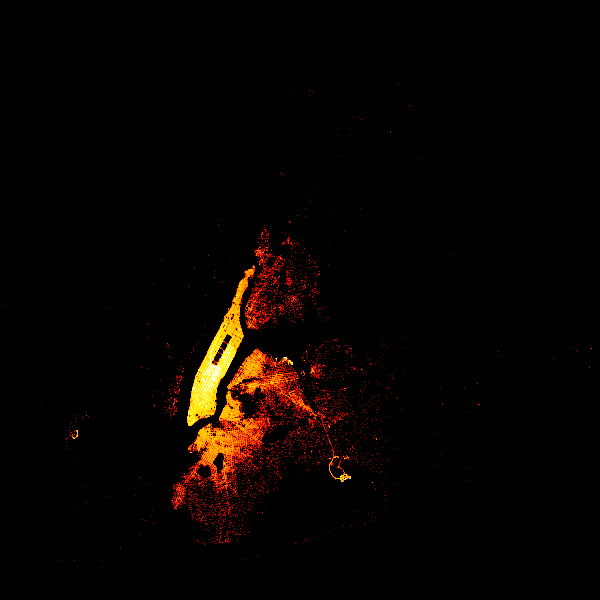

In [10]:
aggregated = datashader.Canvas().points(cleaned_df, 'dropoff_longitude', 'dropoff_latitude')
datashader.tf.set_background(datashader.tf.shade(aggregated, cmap=colorcet.fire), "black")

Let's see the same datashader detail in lower manhatten using http://bboxfinder.com/#40.699511,-74.020214,40.777422,-73.941250

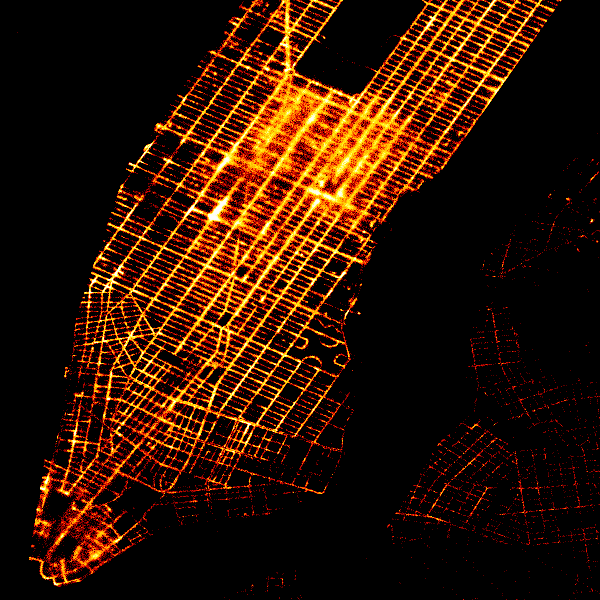

In [11]:
# Clip cleaned dataframe to manhatten bounding box
xmin,xmax,ymin,ymax = [-74.020214,-73.941250,40.699511,40.777422]
manhatten_cleaned = cleaned_df[(cleaned_df['dropoff_latitude'].between(ymin,ymax)) & 
                               (cleaned_df['dropoff_longitude'].between(xmin,xmax))]

# Plot aggregated manhatten dropoff locations using datashader
aggregated = datashader.Canvas().points(manhatten_cleaned, 'dropoff_longitude', 'dropoff_latitude')
datashader.tf.set_background(datashader.tf.shade(aggregated, cmap=colorcet.fire), "black")

## Haversine distance function
Add a distance column to the cleaned dataframe based on the haversince function found here: https://stackoverflow.com/questions/29545704/fast-haversine-approximation-python-pandas/29546836#29546836

Using the mean of the min and max radii of the Earth as 6,367.4445

In [12]:
def haversine_distance(lon1: pandas.Series, lat1: pandas.Series, lon2: pandas.Series, lat2: pandas.Series) -> pandas.Series:
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)

    All args must be of equal length.    

    """
    lon1, lat1, lon2, lat2 = map(numpy.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = numpy.sin(dlat/2.0)**2 + numpy.cos(lat1) * numpy.cos(lat2) * numpy.sin(dlon/2.0)**2

    c = 2 * numpy.arcsin(numpy.sqrt(a))
    km = 6367.4445 * c
    return km

In [13]:
cleaned_df['distance_km'] = haversine_distance(cleaned_df['pickup_longitude'],cleaned_df['pickup_latitude'],cleaned_df['dropoff_longitude'],cleaned_df['dropoff_latitude'])

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


### Inspect distance results

In [14]:
cleaned_df[['trip_duration', 'distance_km']].describe()

,trip_duration,distance_km
count,1.339825e+06,1.339825e+06
mean,8.351070e+02,3.440561e+00
std,6.589208e+02,3.955818e+00
min,1.000000e+00,7.674841e-04
25%,3.940000e+02,1.229190e+00
50%,6.560000e+02,2.068198e+00
75%,1.068000e+03,3.842613e+00
max,7.191000e+03,6.091285e+01


Let's plot the dropoff locations symbolized by the distance of the journey in kilometers.

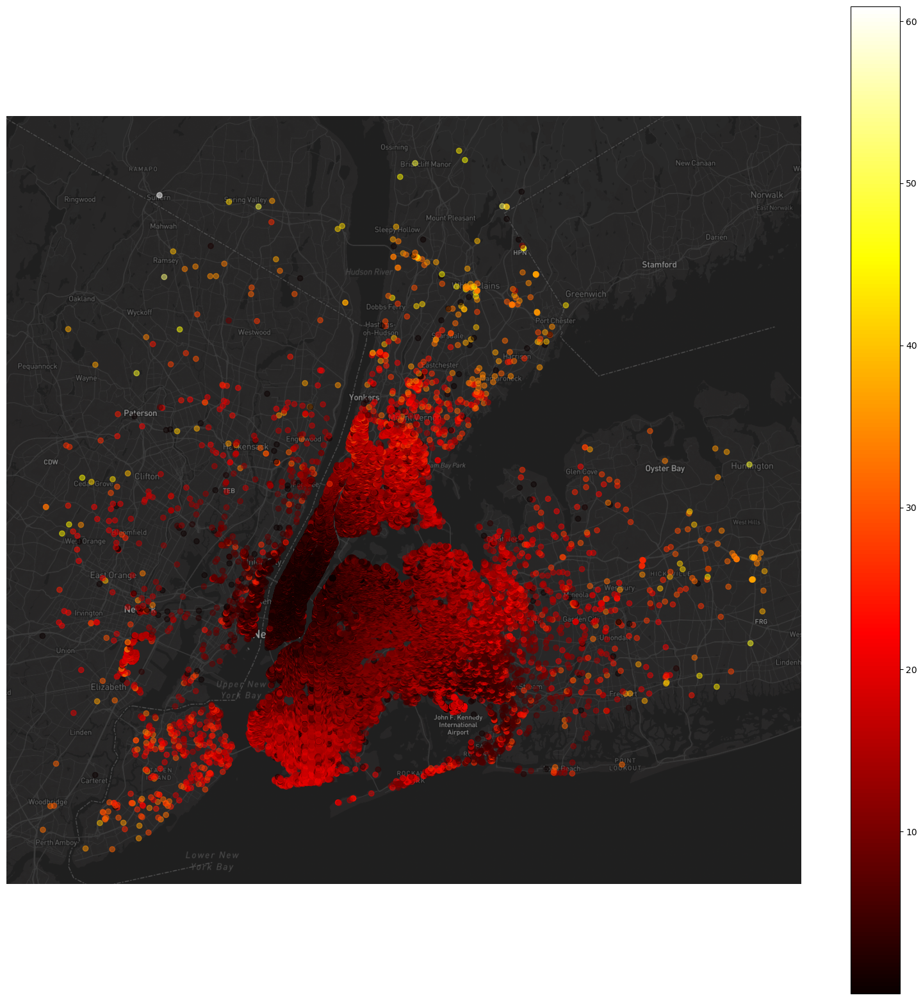

In [15]:
ax = cleaned_df.to_crs(epsg=3857).plot(figsize=(20, 20), column='distance_km', alpha=0.5, cmap='hot', legend=True)
contextily.add_basemap(ax, source=map_source)
ax.set_axis_off()

## KDE plot of dropoff locations originating from JFK Airport

Assuming that the bounding coordinates from JFK are here: http://bboxfinder.com/#40.639651,-73.793449,40.650364,-73.775125, we can filter the dataframe where the pickup locations are within these coordinate ranges.

In [16]:
xmin,ymin,xmax,ymax = [-73.793449,40.639651,-73.775125,40.650364]

jfk_pickup_df = cleaned_df[(cleaned_df['pickup_latitude'].between(ymin,ymax)) & 
                           (cleaned_df['pickup_longitude'].between(xmin,xmax))]

In [17]:
jfk_pickup_df.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,distance_km
count,29515.000000,29515.000000,29515.000000,29515.000000,29515.000000,29515.000000,29515.000000,29515.000000
mean,1.569981,1.717466,-73.783948,40.645275,-73.939683,40.731937,2432.797628,17.467477
std,0.495087,1.317710,0.004859,0.001724,0.076752,0.051899,1116.230095,5.892966
min,1.000000,1.000000,-73.793442,40.639755,-74.267258,40.524029,1.000000,0.000770
25%,1.000000,1.000000,-73.789452,40.644566,-73.985825,40.700666,1714.000000,15.350461
50%,2.000000,1.000000,-73.782448,40.645031,-73.972176,40.743828,2321.000000,19.792489
75%,2.000000,2.000000,-73.781410,40.646641,-73.923248,40.761898,3089.000000,20.957714
max,2.000000,6.000000,-73.775719,40.650360,-73.411194,41.117565,7123.000000,60.912848


<AxesSubplot: xlabel='dropoff_longitude', ylabel='dropoff_latitude'>

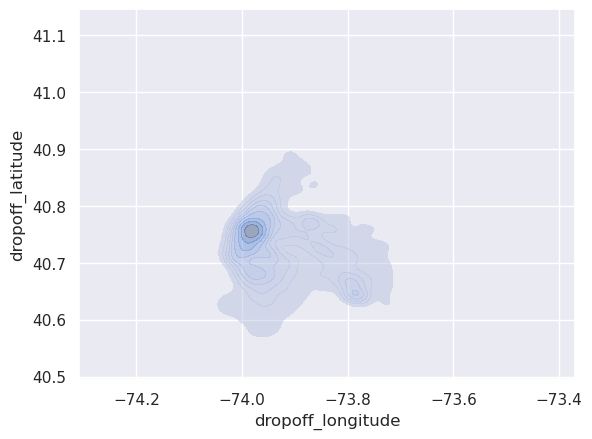

In [18]:
seaborn.set()
seaborn.kdeplot(x=jfk_pickup_df['dropoff_longitude'],y=jfk_pickup_df['dropoff_latitude'], fill=True, alpha=.5)

The above KDE plot shows all of the dropoff data records from the cleaned dataframe where the pickup location originated at JFK airport, plotted at a similar scale to the datashader example above it.
The large cluster in the left part of this plot is downtown manhatten, so let's take a closer look at this area.

Assuming that the bounding coordinates of lower manhatten are: http://bboxfinder.com/#40.699511,-74.020214,40.777422,-73.941250, we can filter the dataframe where the dropoff locations are within these coordinate ranges.

In [19]:
xmin,xmax,ymin,ymax = [-74.020214,-73.941250,40.699511,40.777422]
jfk_manhatten_df = jfk_pickup_df[(jfk_pickup_df['dropoff_latitude'].between(ymin,ymax)) & 
                           (jfk_pickup_df['dropoff_longitude'].between(xmin,xmax))]

<AxesSubplot: xlabel='dropoff_longitude', ylabel='dropoff_latitude'>

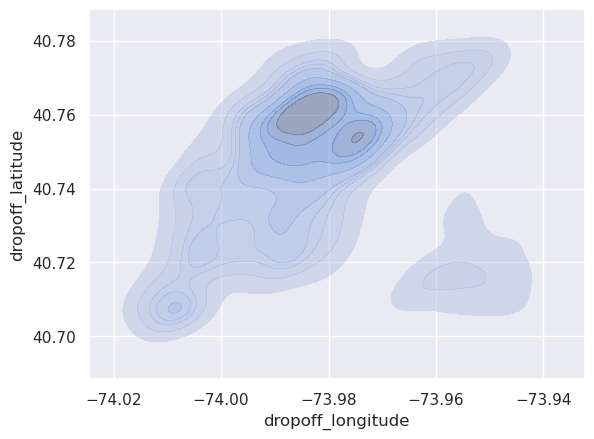

In [20]:
seaborn.set()
seaborn.kdeplot(x=jfk_manhatten_df['dropoff_longitude'],y=jfk_manhatten_df['dropoff_latitude'], fill=True, alpha=.5)

## Plot distribution by day of week
Plot the days of the week from the entire cleaned dataframe

<AxesSubplot: xlabel='pickup_datetime', ylabel='count'>

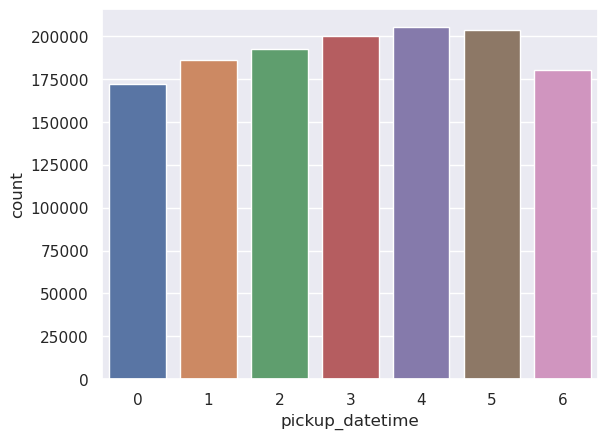

In [21]:
# Convert data to series for easier day/hour retrieval
pickup_dates = cleaned_df['pickup_datetime'].squeeze()

# Plot days of week (0=Monday, 6=Sunday)
seaborn.countplot(x=pickup_dates.dt.dayofweek)

## Plot distribution by hour of day
Plot the hour of day from the cleaned dataframe

<AxesSubplot: xlabel='pickup_datetime', ylabel='count'>

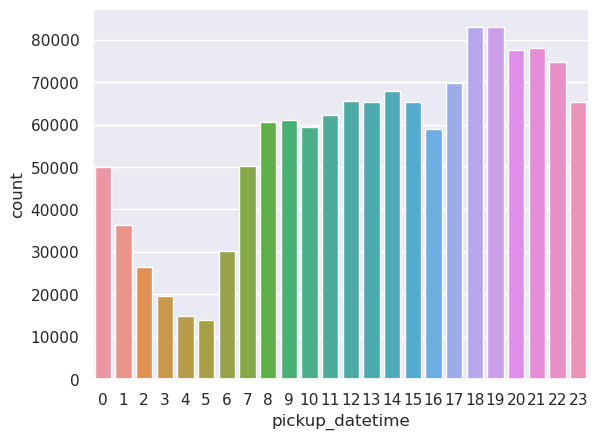

In [22]:
# Plot hour of day
seaborn.countplot(x=pickup_dates.dt.hour)

## Top 10 longest trips from JFK airport
This is a list of the top 10 longest trips that originated from JFK airport.

In [23]:
# Get ten longest journeys
ten_longest = jfk_pickup_df.nlargest(10, 'distance_km')

# Convert geometry to line
ten_longest['line'] = ten_longest.apply(lambda row: LineString([(row['pickup_longitude'], row['pickup_latitude']), (row['dropoff_longitude'], row['dropoff_latitude'])]), axis=1)
ten_longest_line = geopandas.GeoDataFrame(ten_longest, geometry=ten_longest['line'], crs=f"EPSG:4326")

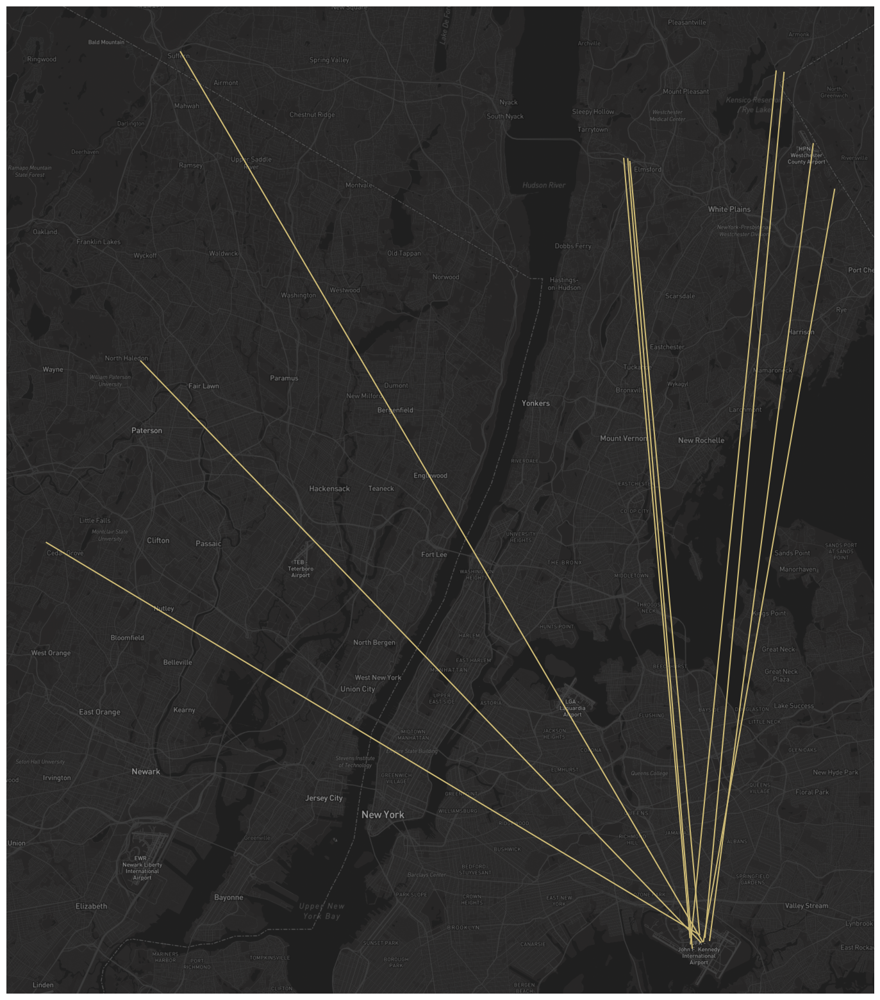

In [24]:
# Plot the ten longest journeys (straight line distance) from jfk
ax = ten_longest_line.to_crs(epsg=3857).plot(figsize=(20, 20), alpha=1.0, color='y')
contextily.add_basemap(ax, source=map_source)
ax.set_axis_off()

## Convert Lat/Lon to Web Mercator
Using the helper functions from Mansour Raad in the Big Data Class to convert the pickup locations from lat/lon to x/y on the entire cleaned dataframe.

In [25]:
def lon_to_x(lon: pandas.Series) -> pandas.Series:
    return lon * 111319.490793274

def lat_to_y(lat: pandas.Series) -> pandas.Series:
    sin = numpy.sin(numpy.deg2rad(lat))
    return 3189068.5 * numpy.log((1.0 + sin) / (1.0 - sin))

In [26]:
cleaned_df['x'] = lon_to_x(cleaned_df['pickup_longitude'])
cleaned_df['y'] = lat_to_y(cleaned_df['pickup_latitude'])

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [27]:
cleaned_df.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,distance_km,x,y
count,1.339825e+06,1.339825e+06,1.339825e+06,1.339825e+06,1.339825e+06,1.339825e+06,1.339825e+06,1.339825e+06,1.339825e+06,1.339825e+06
mean,1.533882e+00,1.663040e+00,-7.397328e+01,4.075083e+01,-7.397314e+01,4.075166e+01,8.351070e+02,3.440561e+00,-8.234668e+06,4.975659e+06
std,4.988509e-01,1.312575e+00,3.822112e-02,2.794839e-02,3.569832e-02,3.217798e-02,6.589208e+02,3.955818e+00,4.254755e+03,4.105934e+03
min,1.000000e+00,0.000000e+00,-7.429039e+01,4.055302e+01,-7.429111e+01,4.051391e+01,1.000000e+00,7.674841e-04,-8.269968e+06,4.946634e+06
25%,1.000000e+00,1.000000e+00,-7.399154e+01,4.073735e+01,-7.399094e+01,4.073585e+01,3.940000e+02,1.229190e+00,-8.236700e+06,4.973677e+06
50%,2.000000e+00,1.000000e+00,-7.398171e+01,4.075366e+01,-7.397968e+01,4.075413e+01,6.560000e+02,2.068198e+00,-8.235607e+06,4.976075e+06
75%,2.000000e+00,2.000000e+00,-7.396812e+01,4.076791e+01,-7.396396e+01,4.076935e+01,1.068000e+03,3.842613e+00,-8.234094e+06,4.978169e+06
max,2.000000e+00,8.000000e+00,-7.342497e+01,4.115737e+01,-7.340984e+01,4.115840e+01,7.191000e+03,6.091285e+01,-8.173631e+06,5.035582e+06


## 10,000 aggregated pickup locations
First, let's create a new dataframe of the first 10,000 records where the pickup locations are within lower manhatten based on here: http://bboxfinder.com/#40.699511,-74.020214,40.777422,-73.941250

In [28]:
xmin,xmax,ymin,ymax = [-74.020214,-73.941250,40.699511,40.777422]
manhatten_pickup = cleaned_df[(cleaned_df['pickup_latitude'].between(ymin,ymax)) & 
                           (cleaned_df['pickup_longitude'].between(xmin,xmax))].head(10000)

Next, let's create aggregated geometry using h3

In [29]:
def geo_to_h3(row):
    return h3.geo_to_h3(lat=row.pickup_latitude,lng=row.pickup_longitude,resolution=11)

def h3_to_wkt(row) -> bytes:
    return Polygon(h3.h3_to_geo_boundary(row.h3_cell, geo_json=True)).wkt

manhatten_pickup['h3_cell'] = manhatten_pickup.apply(geo_to_h3, axis=1)
manhatten_pickup['h3_geom'] = manhatten_pickup.apply(h3_to_wkt, axis=1)

Aggregate the data based on the h3_cell and h3_geom columns, creating a new 'count' column

In [30]:
agg_counts = manhatten_pickup.groupby(['h3_cell','h3_geom']).h3_cell.agg('count').to_frame('count').reset_index()
agg_counts['geometry'] = geopandas.GeoSeries.from_wkt(agg_counts['h3_geom'])
agg_gdf = geopandas.GeoDataFrame(agg_counts, geometry='geometry',crs=f"EPSG:4326")

Plot the aggregated counts of the first 10,000 pickup locations in lower manhatten using h3 cells

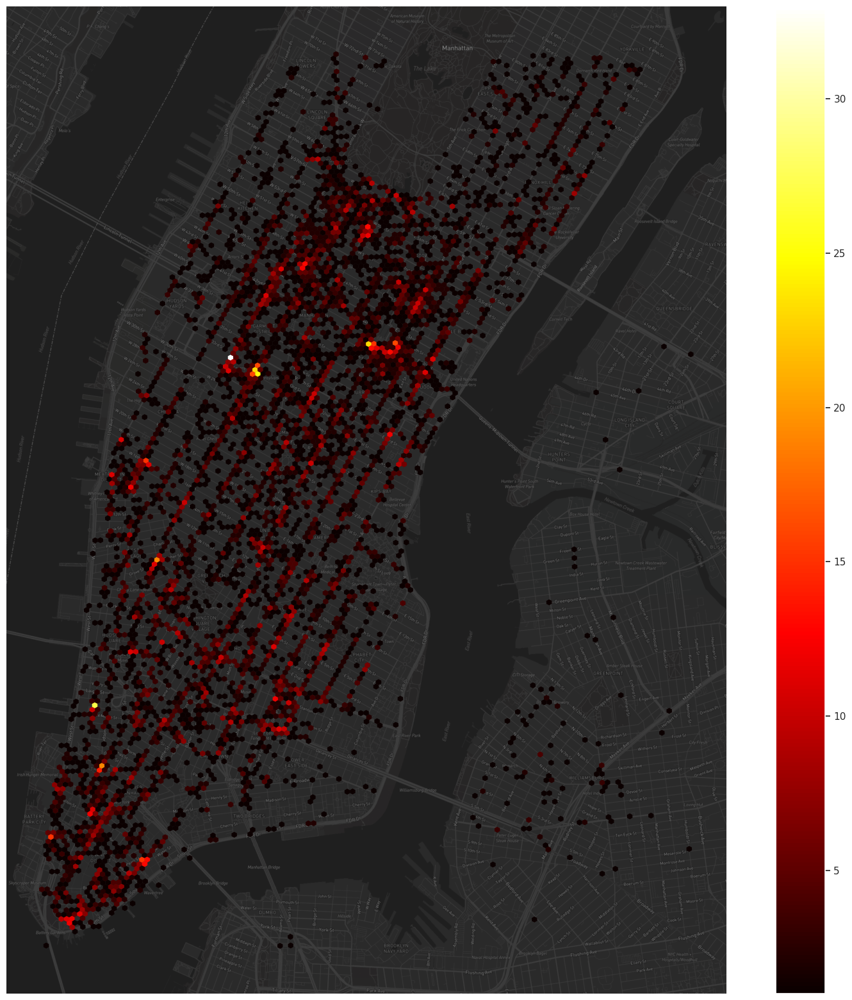

In [31]:
ax = agg_gdf.to_crs(epsg=3857).plot(figsize=(20, 20), column='count', alpha=1.0, cmap='hot', legend=True, edgecolor="face", linewidth=0.1)
contextily.add_basemap(ax, source=map_source)
ax.set_axis_off()

Plot the first 10,000 pickup locations in lower manhatten using aggregated datashader symbology in web mercator

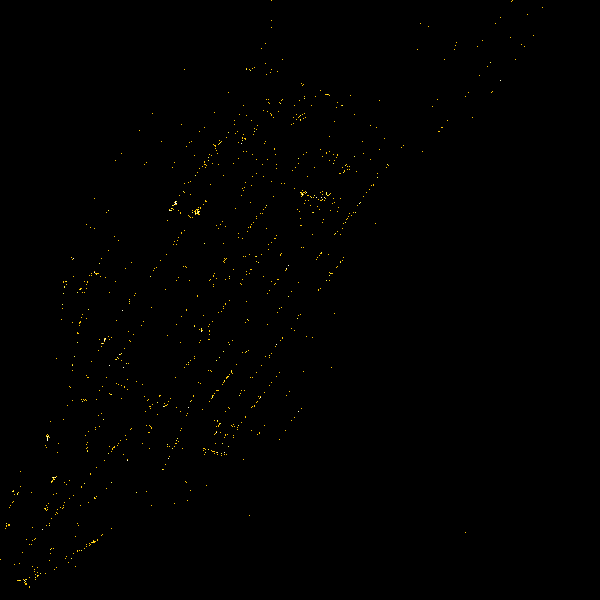

In [32]:
aggregated = datashader.Canvas().points(manhatten_pickup, 'x', 'y')
datashader.tf.set_background(datashader.tf.shade(aggregated, cmap=colorcet.fire), "black")